In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
year = np.arange(2025,2065,5)

YEAR =year
#plt.rc('font',family='Times New Roman')
sludge_pred = pd.read_csv('final_result.csv', encoding='utf-8')

sludge_pred['SLUDGE_PRED'] = sludge_pred['SLUDGE_PRED']/1000
data = pd.ExcelFile('Sludge_GHG.xlsx')
S2GHG = data.parse('S2GHG')
Disposal = data.parse('Disposal')
Sludge_2017_pro =data.parse('Sludge_2017_pro')
CO2_2030 = data.parse('CO2_2030')

S2GHG.set_index('Process', inplace=True)

Sludge_pred = sludge_pred.merge(Disposal,left_on='EPROVINCE',right_on='Province', how='inner')

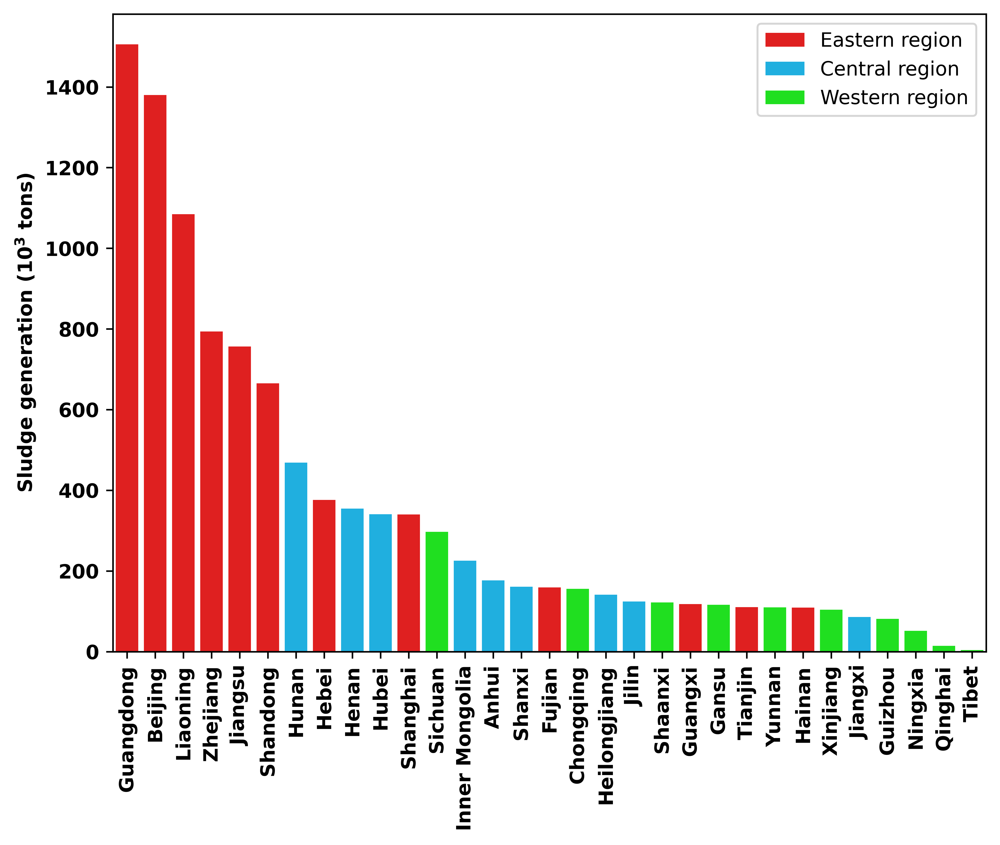

In [2]:
train_data = pd.ExcelFile('训练集.xlsx')
train_pro = train_data.parse('分省')

pro_2017 =  train_pro[train_pro['YEAR']==2017]

pro_2017 = pro_2017[pro_2017['PROVINCE']!='全国']

pro_2017['SLUDGE'] = pro_2017['SLUDGE']/1000
pro_2017 = pro_2017.sort_values(by='SLUDGE', ascending=False)

pro_2017['SLUDGE'] / np.sum(pro_2017['SLUDGE'])
pro_2017.groupby('Region').sum().reset_index().SLUDGE /  np.sum(pro_2017['SLUDGE'])

colors = ['red','deepskyblue', 'lime']

#plt.style.use(['science','ieee','no-latex'])
plt.figure(figsize=(8, 6), dpi=600)
#sns.set(style="whitegrid")
sns.barplot(x='EPROVINCE', y='SLUDGE', hue='Region', data=pro_2017, dodge=False, palette=colors)
plt.xticks(rotation=90,weight='bold')
plt.xlabel(None)
legend = plt.legend()  

plt.rcParams.update({'font.weight':'bold'})
plt.ylabel('Sludge generation ($10^3$ tons)',weight='bold')
plt.yticks(weight='bold')

sns.despine(left=0, right=0, top=0, bottom=0)
#plt.savefig('2017sludge.jpg',dpi=600, bbox_inches = 'tight')

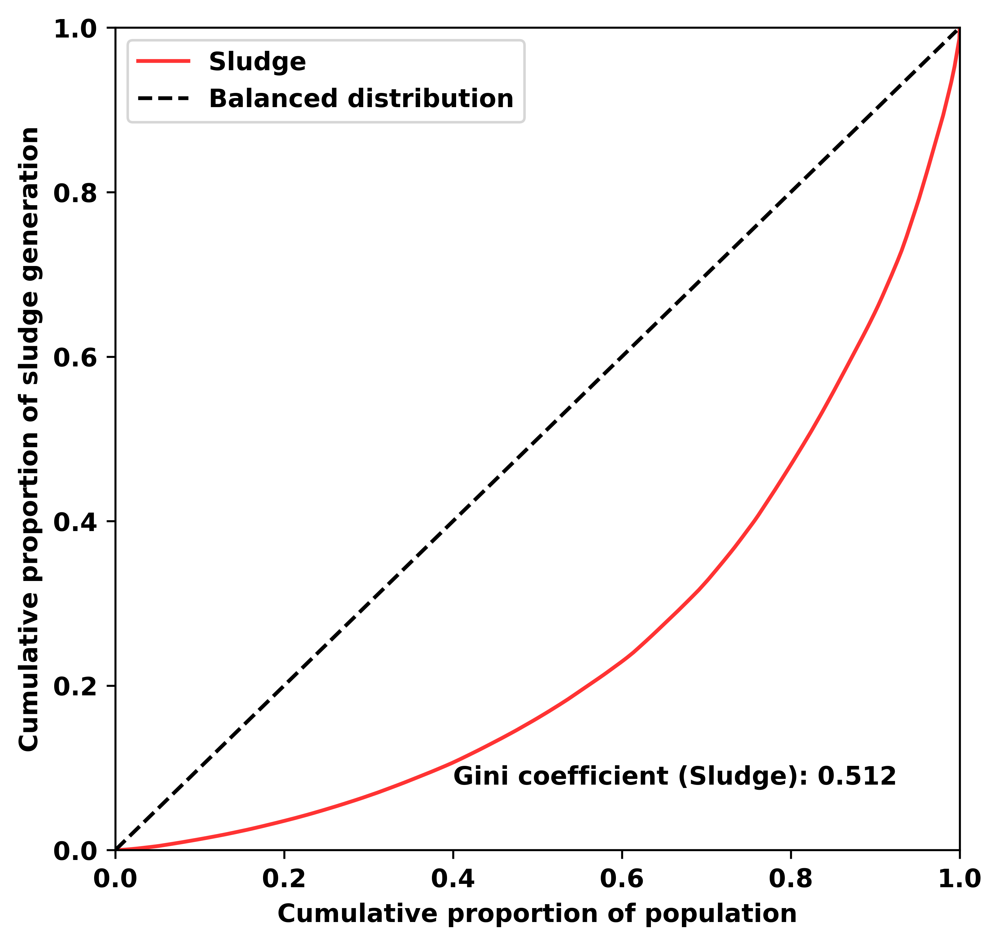

In [3]:
geodetector_data = pd.ExcelFile('地理探测器结果.xlsx')

q_values = geodetector_data.parse('Factor')

q_values = q_values.sort_values(by='Q', ascending=True)

GINI = geodetector_data.parse('GINI')


SPopulation_gini = []
#WPopulation_gini = []
Sludge_gini = []
#Wastewater_gini = []
for i in range(len(GINI['ds'])):
    SPopulation_gini.append(GINI.iloc[0:i+1, 0].sum())
    Sludge_gini.append(GINI.iloc[0:i+1, 1].sum())
    #WPopulation_gini.append(GINI.iloc[0:i+1, 2].sum())
    #Wastewater_gini.append(GINI.iloc[0:i+1, 3].sum())
    

#GINI['WPopulation_gini'] = WPopulation_gini    
GINI['SPopulation_gini'] = SPopulation_gini
GINI['Sludge_gini'] = Sludge_gini   
#GINI['Wastewater_gini'] = Wastewater_gini 


GINI.loc[GINI[GINI['SPopulation_gini'] > 1].index, 'SPopulation_gini'] = 1
#GINI.loc[GINI[GINI['WPopulation_gini'] > 1].index, 'WPopulation_gini'] = 1
GINI.loc[GINI[GINI['Sludge_gini'] > 1].index, 'Sludge_gini'] = 1
#GINI.loc[GINI[GINI['Wastewater_gini'] > 1].index, 'Wastewater_gini'] = 1




#plt.rc('font', family='Times New Roman')
plt.figure(figsize=(6, 6), dpi=600)
plt.plot(GINI['SPopulation_gini'], GINI['Sludge_gini'], color='red', label='Sludge', alpha=0.8)
#plt.plot(GINI['WPopulation_gini'], GINI['Wastewater_gini'], color='blue', label='Wastewater', alpha=0.5)
plt.plot(np.arange(0,1,1/285), np.arange(0,1,1/285), linestyle='--', color='black', label='Balanced distribution')

plt.xlim([0, 1])
plt.ylim([0, 1])

plt.xlabel('Cumulative proportion of population',weight='bold')
plt.ylabel('Cumulative proportion of sludge generation',weight='bold')

plt.text(0.4,0.08,'Gini coefficient (Sludge): 0.512',weight='bold')
#plt.text(0.525,0.15,'Gini coefficient (Wastewater): 0.509')
plt.yticks(weight='bold')
plt.xticks(weight='bold')
plt.rcParams.update({'font.weight':'bold'})
plt.legend()
sns.despine(left=0, right=0, top=0, bottom=0)
#plt.savefig('GINI.jpg', dpi=600)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, 'Tibet'),
  Text(1, 0, 'Chongqing'),
  Text(2, 0, 'Sichuan'),
  Text(3, 0, 'Xinjiang'),
  Text(4, 0, 'Inner Mongolia'),
  Text(5, 0, 'Heilongjiang'),
  Text(6, 0, 'Zhejiang'),
  Text(7, 0, 'Jiangxi'),
  Text(8, 0, 'Jilin'),
  Text(9, 0, 'Liaoning'),
  Text(10, 0, 'Tianjin'),
  Text(11, 0, 'Anhui'),
  Text(12, 0, 'Guangxi'),
  Text(13, 0, 'Guangdong'),
  Text(14, 0, 'Fujian'),
  Text(15, 0, 'Gansu'),
  Text(16, 0, 'Jiangsu'),
  Text(17, 0, 'Shandong'),
  Text(18, 0, 'Hebei'),
  Text(19, 0, 'Hubei'),
  Text(20, 0, 'Shaanxi'),
  Text(21, 0, 'Yunnan'),
  Text(22, 0, 'Shanxi'),
  Text(23, 0, 'Shanghai'),
  Text(24, 0, 'Henan'),
  Text(25, 0, 'Guizhou'),
  Text(26, 0, 'Hainan'),
  Text(27, 0, 'Qinghai'),
  Text(28, 0, 'Ningxia'),
  Text(29, 0, 'Beijing')])

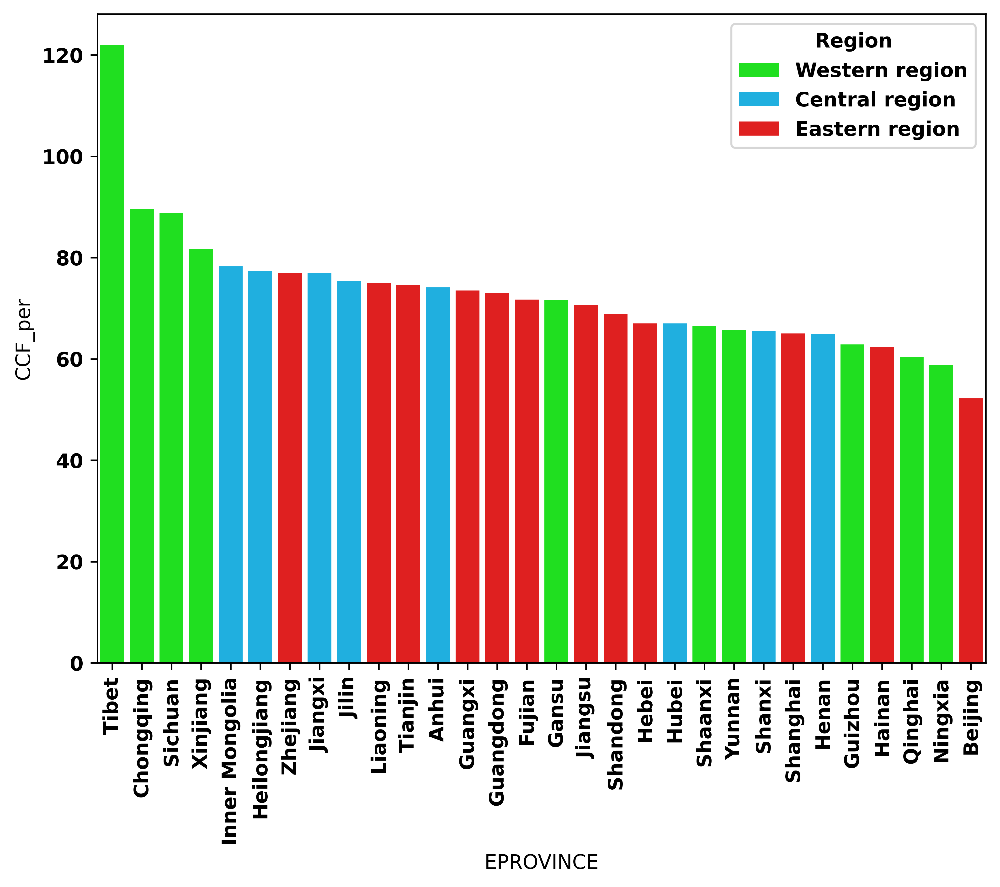

In [4]:
cluster = pd.read_csv('Cluster_results.csv')

train_pro_clu_2017 = train_pro.merge(cluster, on='EPROVINCE', how='inner')

train_pro_clu_2017 = train_pro_clu_2017[train_pro_clu_2017['YEAR']==2017]

train_pro_clu_2017['CCF_per'] = train_pro_clu_2017['CCF'] / train_pro_clu_2017['POP']

train_pro_clu_2017.sort_values(by='CCF_per',ascending=False, inplace=True)


rec_low = 170*365/1000

rec_high = 280*365/1000

plt.figure(figsize=(8, 6), dpi=600)
sns.barplot(x='EPROVINCE', y='CCF_per', hue='Region', data=train_pro_clu_2017, dodge=False, palette=colors[::-1])

plt.xticks(rotation=90)

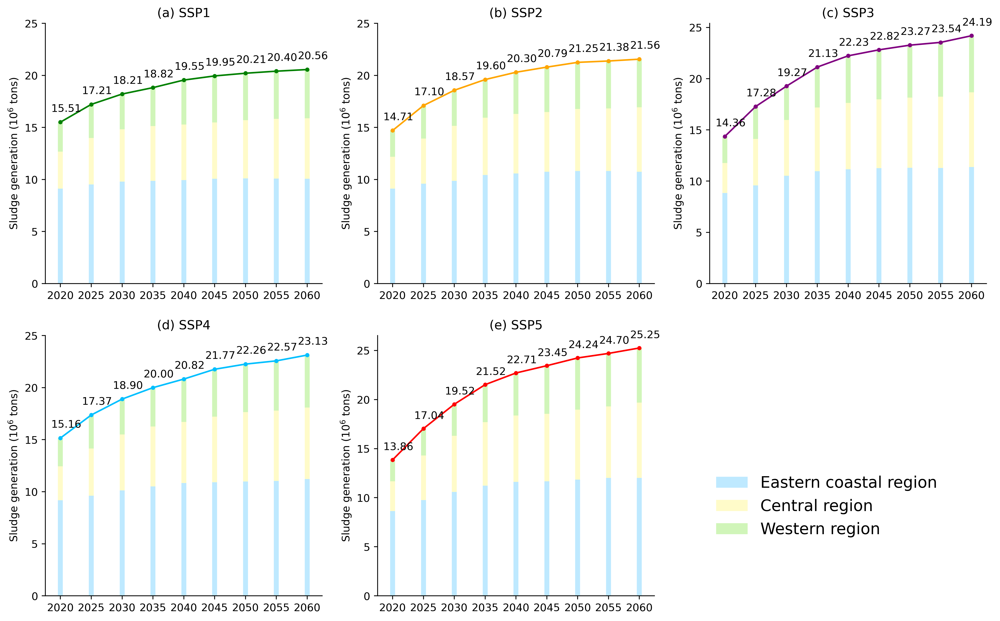

In [2]:
final_result = pd.read_csv('final_result.csv', encoding='utf-8')
final_result.groupby(['SSP','YEAR']).sum().reset_index().to_csv('sludge_pred_qg.csv', encoding='utf_8_sig')

sludge_pred_qg = pd.read_csv('sludge_pred_qg.csv', encoding='utf-8')
sludge_pred_pro = pd.read_csv('final_result.csv', encoding='utf-8')
sludge_pred_qg['SLUDGE_PRED'] = sludge_pred_qg['SLUDGE_PRED']/1000000
sludge_pred_pro['SLUDGE_PRED'] = sludge_pred_pro['SLUDGE_PRED']/1000000

sludge_pred_qg = sludge_pred_qg.set_index('YEAR')
sludge_pred_pro = sludge_pred_pro.set_index('YEAR')


YEAR = np.arange(2020,2065,5)
YEAR

sludge_pred_qg = sludge_pred_qg.loc[YEAR]
sludge_pred_qg = sludge_pred_qg.reset_index()
sludge_pred_pro = sludge_pred_pro.loc[YEAR]
sludge_pred_pro = sludge_pred_pro.reset_index()

sludge_pred_pro = sludge_pred_pro.groupby(['SSP','YEAR', 'Region']).sum().reset_index()
sludge_pred_pro

def draw_ssp_qg(df, SSP, number, color):
    
    #plt.rc('font',family='Times New Roman')
    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')]['YEAR'], 
        height=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')]['SLUDGE_PRED'],
        label='Eastern coastal region',
        color=(190/255,233/255,1))
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Central region')]['YEAR'], 
        height=df[(df['SSP']==SSP) & (df['Region']=='Central region')]['SLUDGE_PRED'],
        bottom=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')]['SLUDGE_PRED'],
        color=(255/255,251/255,201/255),
        label='Central region')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Western region')]['YEAR'], 
        height=df[(df['SSP']==SSP) & (df['Region']=='Western region')]['SLUDGE_PRED'],
        bottom=np.array(df[(df['SSP']==SSP) & (df['Region']=='Central region')]['SLUDGE_PRED']) +
        np.array(df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')]['SLUDGE_PRED']),
        color=(208/255,245/255,185/255),
        label='Western region')
    
    plt.plot(YEAR,
             sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED'],
             linestyle='-', marker='.',
             color=color)
    
    for x,y in zip(YEAR, sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']):
        plt.text(x-1.5,y+1,'{:.2f}'.format(y))
        
    plt.ylabel('Sludge generation ($10^6$ tons)')
    plt.xticks([2020,2025,2030,2035,2040,2045,2050,2055,2060])
    plt.yticks([0,5,10,15,20,25])
    plt.title(number+' '+SSP)
    
    sns.despine()
    
plt.figure(figsize=(16, 10), dpi=400)

plt.subplot(2,3,1)
draw_ssp_qg(sludge_pred_pro, 'SSP1', '(a)', 'green')

plt.subplot(2,3,2)
draw_ssp_qg(sludge_pred_pro, 'SSP2', '(b)', 'orange')

plt.subplot(2,3,3)
draw_ssp_qg(sludge_pred_pro, 'SSP3', '(c)', 'purple')

plt.subplot(2,3,4)
draw_ssp_qg(sludge_pred_pro, 'SSP4', '(d)', 'deepskyblue')

plt.subplot(2,3,5)
draw_ssp_qg(sludge_pred_pro, 'SSP5', '(e)', 'red')

plt.legend(loc=(1.2,0.2), frameon=False, fontsize=15)
#plt.savefig('2.png', dpi=400)

In [3]:
#计算未来污泥碳排放
#读取并展示数据
sludge_pred = pd.read_csv('final_result.csv', encoding='utf-8')

sludge_pred['SLUDGE_PRED'] = sludge_pred['SLUDGE_PRED']/1000
data = pd.ExcelFile('Sludge_GHG.xlsx')
S2GHG = data.parse('S2GHG')
Disposal = data.parse('Disposal')
Sludge_2017_pro =data.parse('Sludge_2017_pro')
CO2_2030 = data.parse('CO2_2030')
S2GHG.set_index('Process', inplace=True)

Sludge_pred = sludge_pred.merge(Disposal,left_on='EPROVINCE',right_on='Province', how='inner')

Sludge_pred['Landfill_2015_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Landfill_percent_2015
Sludge_pred['Incineration_2015_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Incineration_percent_2015
Sludge_pred['Land_application_2015_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Land_application_percent_2015
Sludge_pred['Building_material_2015_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Building_material_percent_2015

Sludge_pred['Landfill_2015_standard_future_GHG_Before_AD'] = Sludge_pred.Landfill_2015_standard_future \
                                                   *S2GHG.loc['Before_AD','Landfill']/1000000
Sludge_pred['Incineration_2015_standard_future_GHG_Before_AD'] = Sludge_pred.Incineration_2015_standard_future \
                                                   *S2GHG.loc['Before_AD','Incineration']/1000000
Sludge_pred['Land_application_2015_standard_future_GHG_Before_AD'] = Sludge_pred.Land_application_2015_standard_future \
                                                   *S2GHG.loc['Before_AD','Land_application']/1000000
Sludge_pred['Building_material_2015_standard_future_GHG_Before_AD'] = Sludge_pred.Building_material_2015_standard_future \
                                                   *S2GHG.loc['Before_AD','Building_material']/1000000


Sludge_pred['Landfill_2015_standard_future_GHG_After_AD'] = Sludge_pred.Landfill_2015_standard_future \
                                                   *S2GHG.loc['After_AD','Landfill']/1000000
Sludge_pred['Incineration_2015_standard_future_GHG_After_AD'] = Sludge_pred.Incineration_2015_standard_future \
                                                   *S2GHG.loc['After_AD','Incineration']/1000000
Sludge_pred['Land_application_2015_standard_future_GHG_After_AD'] = Sludge_pred.Land_application_2015_standard_future \
                                                   *S2GHG.loc['After_AD','Land_application']/1000000
Sludge_pred['Building_material_2015_standard_future_GHG_After_AD'] = Sludge_pred.Building_material_2015_standard_future \
                                                   *S2GHG.loc['After_AD','Building_material']/1000000


Sludge_pred['Sum_2015_standard_future_GHG_Before_AD'] = Sludge_pred['Landfill_2015_standard_future_GHG_Before_AD'] \
                                                   + Sludge_pred['Incineration_2015_standard_future_GHG_Before_AD'] \
                                                   + Sludge_pred['Land_application_2015_standard_future_GHG_Before_AD'] \
                                                   + Sludge_pred['Building_material_2015_standard_future_GHG_Before_AD'] \

Sludge_pred['Sum_2015_standard_future_GHG_After_AD'] = Sludge_pred['Landfill_2015_standard_future_GHG_After_AD'] \
                                                   + Sludge_pred['Incineration_2015_standard_future_GHG_After_AD'] \
                                                   + Sludge_pred['Land_application_2015_standard_future_GHG_After_AD'] \
                                                   + Sludge_pred['Building_material_2015_standard_future_GHG_After_AD'] \

Sludge_pred['PGER_2015_standard_future'] = Sludge_pred['Sum_2015_standard_future_GHG_After_AD']-Sludge_pred['Sum_2015_standard_future_GHG_Before_AD']
#Sludge_pred_china = Sludge_pred.iloc[-1,:]

#Sludge_pred = Sludge_pred.iloc[0:31,:]
#Sludge_pred = Sludge_pred.drop(Sludge_pred[Sludge_pred['Province']=='Tibet'].index) 

#Sludge_pred = Sludge_pred.reset_index()


Sludge_pred['Landfill_new_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Landfill_percent_new
Sludge_pred['Incineration_new_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Incineration_percent_new
Sludge_pred['Land_application_new_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Land_application_percent_new
Sludge_pred['Building_material_new_standard_future'] = Sludge_pred.SLUDGE_PRED\
                                                   *Sludge_pred.Building_material_percent_new

Sludge_pred['Landfill_new_standard_future_GHG_Before_AD'] = Sludge_pred.Landfill_new_standard_future \
                                                   *S2GHG.loc['Before_AD','Landfill']/1000000
Sludge_pred['Incineration_new_standard_future_GHG_Before_AD'] = Sludge_pred.Incineration_new_standard_future \
                                                   *S2GHG.loc['Before_AD','Incineration']/1000000
Sludge_pred['Land_application_new_standard_future_GHG_Before_AD'] = Sludge_pred.Land_application_new_standard_future \
                                                   *S2GHG.loc['Before_AD','Land_application']/1000000
Sludge_pred['Building_material_new_standard_future_GHG_Before_AD'] = Sludge_pred.Building_material_new_standard_future \
                                                   *S2GHG.loc['Before_AD','Building_material']/1000000


Sludge_pred['Landfill_new_standard_future_GHG_After_AD'] = Sludge_pred.Landfill_new_standard_future \
                                                   *S2GHG.loc['After_AD','Landfill']/1000000
Sludge_pred['Incineration_new_standard_future_GHG_After_AD'] = Sludge_pred.Incineration_new_standard_future \
                                                   *S2GHG.loc['After_AD','Incineration']/1000000
Sludge_pred['Land_application_new_standard_future_GHG_After_AD'] = Sludge_pred.Land_application_new_standard_future \
                                                   *S2GHG.loc['After_AD','Land_application']/1000000
Sludge_pred['Building_material_new_standard_future_GHG_After_AD'] = Sludge_pred.Building_material_new_standard_future \
                                                   *S2GHG.loc['After_AD','Building_material']/1000000


Sludge_pred['Sum_new_standard_future_GHG_Before_AD'] = Sludge_pred['Landfill_new_standard_future_GHG_Before_AD'] \
                                                   + Sludge_pred['Incineration_new_standard_future_GHG_Before_AD'] \
                                                   + Sludge_pred['Land_application_new_standard_future_GHG_Before_AD'] \
                                                   + Sludge_pred['Building_material_new_standard_future_GHG_Before_AD'] \

Sludge_pred['Sum_new_standard_future_GHG_After_AD'] = Sludge_pred['Landfill_new_standard_future_GHG_After_AD'] \
                                                   + Sludge_pred['Incineration_new_standard_future_GHG_After_AD'] \
                                                   + Sludge_pred['Land_application_new_standard_future_GHG_After_AD'] \
                                                   + Sludge_pred['Building_material_new_standard_future_GHG_After_AD'] \

Sludge_pred['PGER_new_standard_future'] = Sludge_pred['Sum_new_standard_future_GHG_After_AD']-Sludge_pred['Sum_new_standard_future_GHG_Before_AD']

cator = pd.read_csv('Cluster_results.csv')

Sludge_pred = Sludge_pred.merge(cator, on='EPROVINCE', how='inner')

Sludge_predqg = Sludge_pred.groupby(['SSP', 'YEAR', 'cator']).sum().reset_index()

Sludge_predqg = Sludge_predqg.set_index('YEAR')
Sludge_predqg = Sludge_predqg.loc[year]

Sludge_predqg = Sludge_predqg.reset_index()

Sludge_predqg2 =  Sludge_pred.groupby(['SSP', 'YEAR']).sum().reset_index()

Sludge_predqg2 = Sludge_predqg2.set_index('YEAR')
Sludge_predqg2 = Sludge_predqg2.loc[year]

Sludge_predqg2 = Sludge_predqg2.reset_index()

def draw_ssp_qg_result(df, SSP, number, color, result, width,label):
    sns.set_context("paper")
    
    #plt.rc('font',family='Times New Roman')
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==2)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==2)][result],
        label='HL', 
        color='red')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==1)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==1)][result],
        bottom=df[(df['SSP']==SSP) & (df['cator']==2)][result],
        color='orange', 
        label='HH')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==3)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==3)][result],
        bottom=np.array(df[(df['SSP']==SSP) & (df['cator']==1)][result]) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==2)][result]),
        color='deepskyblue', 
        label='LH')
    
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==0)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==0)][result],
        bottom=np.array(df[(df['SSP']==SSP) & (df['cator']==1)][result]) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==2)][result]) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==3)][result]),
        color='g', 
        label='LL')
    
    #plt.plot(YEAR,
             #sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']+0.3,
             #linestyle='-', marker='.',
             #color=color)
                                                       
    plt.plot(YEAR[1:-1]+width,
             Sludge_predqg2[(Sludge_predqg2['SSP']==SSP)][result]+0.6,
             linestyle='-', marker='.',
             color=color,label=label)
    #for x,y in zip(YEAR, sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']):
    #    plt.text(x-1.6,y+1.4,'{:.2f}'.format(y), weight='bold',fontsize=8)
        
    #plt.ylabel('Sludge generation ($10^6$ tons)', weight='bold')
    #plt.ylim(0,26)
    #plt.xticks([2020,2025,2030,2035,2040,2045,2050,2055,2060], weight='bold')
    #plt.yticks([0,5,10,15,20,25], weight='bold')
    #plt.title(number+' '+SSP, weight='bold')
    plt.ylabel('Greenhouse gas emissions (Mt $CO_2$)', weight='bold')
    plt.xticks([2025,2030,2035,2040,2045,2050,2055], weight='bold')
    plt.yticks(np.arange(10,71,10), weight='bold')
    plt.title(number+' '+SSP, weight='bold')
    sns.despine()
'''
def draw_ssp_qg_result2(df, SSP, number, color, result, width,label):
    
    #plt.rc('font',family='Times New Roman')
    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')][result],
        label='Eastern coastal region',
        color=(190/255,233/255,1))
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Central region')]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['Region']=='Central region')][result],
        bottom=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')][result],
        color=(255/255,251/255,201/255),
        label='Central region')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Western region')]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['Region']=='Western region')][result],
        bottom=np.array(df[(df['SSP']==SSP) & (df['Region']=='Central region')][result]) +
        np.array(df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')][result]),
        color=(208/255,245/255,185/255),
        label='Western region')
    
    plt.plot(YEAR+width,
             Sludge_predqg2[(Sludge_predqg2['SSP']==SSP)][result],
             linestyle='-', marker='.',
             color=color,label=label)
    
    #for x,y in zip(YEAR, sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']):
     #   plt.text(x-1.5,y+1,'{:.2f}'.format(y))
        
    plt.ylabel('Sludge generation ($10^6$ tons)')
    plt.xticks([2020,2025,2030,2035,2040,2045,2050,2055,2060])
    plt.yticks(np.arange(10,71,10))
    plt.title(number+' '+SSP)
    
    sns.despine()
'''

# plt.figure(figsize=(16, 10), dpi=600)

# plt.subplot(2,3,1)
# draw_ssp_qg_result(Sludge_predqg, 'SSP1', '(a)', 'red','Sum_2015_standard_future_GHG_Before_AD',0, 'Without AD')
# draw_ssp_qg_result(Sludge_predqg, 'SSP1', '(a)', 'green','Sum_new_standard_future_GHG_After_AD',1, 'With AD')


# plt.subplot(2,3,2)
# draw_ssp_qg_result(Sludge_predqg, 'SSP2', '(b)', 'red','Sum_2015_standard_future_GHG_Before_AD',0, 'Without AD')
# draw_ssp_qg_result(Sludge_predqg, 'SSP2', '(b)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

# plt.subplot(2,3,3)
# draw_ssp_qg_result(Sludge_predqg, 'SSP3', '(c)', 'red','Sum_2015_standard_future_GHG_Before_AD',0, 'Without AD')
# draw_ssp_qg_result(Sludge_predqg, 'SSP3', '(c)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

# plt.subplot(2,3,4)
# draw_ssp_qg_result(Sludge_predqg, 'SSP4', '(d)', 'red','Sum_2015_standard_future_GHG_Before_AD',0, 'Without AD')
# draw_ssp_qg_result(Sludge_predqg, 'SSP4', '(d)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

# plt.subplot(2,3,5)
# draw_ssp_qg_result(Sludge_predqg, 'SSP5', '(e)', 'red','Sum_2015_standard_future_GHG_Before_AD',0, 'Without AD')
# draw_ssp_qg_result(Sludge_predqg, 'SSP5', '(e)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

# plt.legend(loc=(1.2,0.1), frameon=False, fontsize=15)
# plt.rcParams.update({'font.weight':'bold'})
#plt.savefig('future_car.jpg', dpi=600, bbox_inches = 'tight')

"\ndef draw_ssp_qg_result2(df, SSP, number, color, result, width,label):\n    \n    #plt.rc('font',family='Times New Roman')\n    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')]['YEAR']+width, \n        height=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')][result],\n        label='Eastern coastal region',\n        color=(190/255,233/255,1))\n    \n    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Central region')]['YEAR']+width, \n        height=df[(df['SSP']==SSP) & (df['Region']=='Central region')][result],\n        bottom=df[(df['SSP']==SSP) & (df['Region']=='Eastern coastal region')][result],\n        color=(255/255,251/255,201/255),\n        label='Central region')\n    \n    plt.bar(x=df[(df['SSP']==SSP) & (df['Region']=='Western region')]['YEAR']+width, \n        height=df[(df['SSP']==SSP) & (df['Region']=='Western region')][result],\n        bottom=np.array(df[(df['SSP']==SSP) & (df['Region']=='Central region')][result]) +\n        n

In [32]:
Sludge_predqg2

,YEAR,SSP,GDP,POP,CCF,人均CCF,BA,LDP,UR,FCE_P,FCE,SLUDGE_PRED,Landfill_2015,Incineration_2015,Land_application_2015,Building_material_2015,Landfill_percent_2015,Incineration_percent_2015,Land_application_percent_2015,Building_material_percent_2015,Landfill_percent_2030,Incineration_percent_2030,Land_application_percent_2030,Building_material_percent_2030,other,Landfill_percent_new,Incineration_percent_new,Land_application_percent_new,Building_material_percent_new,Landfill_2015_standard_future,Incineration_2015_standard_future,Land_application_2015_standard_future,Building_material_2015_standard_future,Landfill_2015_standard_future_GHG_Before_AD,Incineration_2015_standard_future_GHG_Before_AD,Land_application_2015_standard_future_GHG_Before_AD,Building_material_2015_standard_future_GHG_Before_AD,Landfill_2015_standard_future_GHG_After_AD,Incineration_2015_standard_future_GHG_After_AD,Land_application_2015_standard_future_GHG_After_AD,Building_material_2015_standard_future_GHG_After_AD,Sum_2015_standard_future_GHG_Before_AD,Sum_2015_standard_future_GHG_After_AD,PGER_2015_standard_future,Landfill_new_standard_future,Incineration_new_standard_future,Land_application_new_standard_future,Building_material_new_standard_future,Landfill_new_standard_future_GHG_Before_AD,Incineration_new_standard_future_GHG_Before_AD,Land_application_new_standard_future_GHG_Before_AD,Building_material_new_standard_future_GHG_Before_AD,Landfill_new_standard_future_GHG_After_AD,Incineration_new_standard_future_GHG_After_AD,Land_application_new_standard_future_GHG_After_AD,Building_material_new_standard_future_GHG_After_AD,Sum_new_standard_future_GHG_Before_AD,Sum_new_standard_future_GHG_After_AD,PGER_new_standard_future,Unnamed: 0,SSP1_2060,SSP2_2060,SSP3_2060,SSP4_2060,SSP5_2060,SLUDGE_2017,PSSP1_2060,PSSP2_2060,PSSP3_2060,PSSP4_2060,PSSP5_2060,cator
0,2025,SSP1,1.133259e+06,1323046195,2.897471e+10,1800,65212.419439,8.598527e+05,1942.056931,260289.910032,76782.875591,17214.140517,2585.1,1341.0,1124.4,829.7,16.63926,3.52202,6.55102,3.287701,3.0,6.0,16.5,4.5,1.5,1.5,1.5,21.0,6.0,8409.683353,2795.855145,3393.246054,2615.355966,16.752089,16.355753,1.727162,15.273679,4.776700,11.183421,1.191029,2.202130,50.108683,19.353280,-30.755403,860.707026,860.707026,12049.898362,3442.828103,1.714528,5.035136,6.133398,20.106116,0.488882,3.442828,4.229514,2.898861,32.989179,11.060085,-21.929094,435,2.056000e+07,2.155669e+07,2.419032e+07,2.312937e+07,2.525484e+07,10062697,113.651605,120.023134,139.244152,129.807871,137.007667,56
1,2025,SSP2,1.103715e+06,1349025292,3.446760e+10,2100,67841.967278,8.829289e+05,1964.428561,266568.638163,81120.623710,17102.910553,2585.1,1341.0,1124.4,829.7,16.63926,3.52202,6.55102,3.287701,3.0,6.0,16.5,4.5,1.5,1.5,1.5,21.0,6.0,8367.352626,2805.449510,3294.242333,2635.866084,16.667766,16.411880,1.676769,15.393458,4.752656,11.221798,1.156279,2.219399,50.149873,19.350133,-30.799741,855.145528,855.145528,11972.037387,3420.582111,1.703450,5.002601,6.093767,19.976200,0.485723,3.420582,4.202185,2.880130,32.776018,10.988620,-21.787398,435,2.056000e+07,2.155669e+07,2.419032e+07,2.312937e+07,2.525484e+07,10062697,113.651605,120.023134,139.244152,129.807871,137.007667,56
2,2025,SSP3,1.100747e+06,1323826544,4.348770e+10,2700,70678.240741,9.511288e+05,2017.578121,290109.565085,89701.050666,17280.521112,2585.1,1341.0,1124.4,829.7,16.63926,3.52202,6.55102,3.287701,3.0,6.0,16.5,4.5,1.5,1.5,1.5,21.0,6.0,8329.172796,2936.993063,3309.120503,2705.234750,16.591712,17.181409,1.684342,15.798571,4.730970,11.747972,1.161501,2.277808,51.256035,19.918251,-31.337784,864.026056,864.026056,12096.364778,3456.104222,1.721140,5.054552,6.157050,20.183649,0.490767,3.456104,4.245824,2.910040,33.116391,11.102735,-22.013656,435,2.056000e+07,2.155669e+07,2.419032e+07,2.312937e+07,2.525484e+07,10062697,113.651605,120.023134,139.244152,129.807871,137.007667,56
3,2025,SSP4,1.125382e+06,1319085308,3.851729e+10,2400,68966.449234,9.074705e+05,1989.929111,280810.729046,84985.957512,17372.362

In [4]:
import pandas as pd
sens = pd.read_csv('sens.csv')
sens = sens.iloc[0:8,0:16]
sens

,YEAR,SSP1-,SSP1,SSP1+,SSP2-,SSP2,SSP2+,SSP3-,SSP3,SSP3+,SSP4-,SSP4,SSP4+,SSP5-,SSP5,SSP5+
0,2025,16.880000,17.214141,17.850000,16.78000,17.102911,17.602911,16.416495,17.280521,18.144547,16.503744,17.372362,18.240980,16.340265,17.040265,19.090000
1,2030,17.770000,18.208478,18.920000,17.87000,18.568977,19.168977,18.306036,19.269512,20.232988,17.956383,18.901456,19.846529,19.031532,19.521532,21.340000
2,2035,18.370000,18.823409,19.480000,18.59000,19.599201,20.299201,20.074850,21.131421,22.187992,18.997856,19.997743,20.997630,21.100750,21.520075,23.280000
3,2040,19.040000,19.550849,20.170000,19.38000,20.300151,20.900151,21.117677,22.229134,23.340591,19.782247,20.823418,21.864589,22.107695,22.707695,23.920000
4,2045,19.370000,19.947885,20.680000,19.73000,20.793432,21.293432,21.674599,22.815367,23.956135,20.677763,21.766066,22.854369,22.450522,23.450522,24.680000
5,2050,19.640000,20.206604,20.940000,20.28000,21.251659,21.951659,22.106197,23.269681,24.433165,21.147941,22.260991,23.374041,23.139964,24.239964,25.037000
6,2055,19.830000,20.403797,21.060000,20.75000,21.382020,21.982020,22.365036,23.542143,24.719250,21.444191,22.572833,23.701475,24.101694,24.701694,25.491000
7,2060,19.986203,20.560000,21.216203,20.92398,21.556000,22.156000,22.609893,23.787000,24.964107,21.991358,23.120000,24.248642,24.654000,25.254000,26.043306


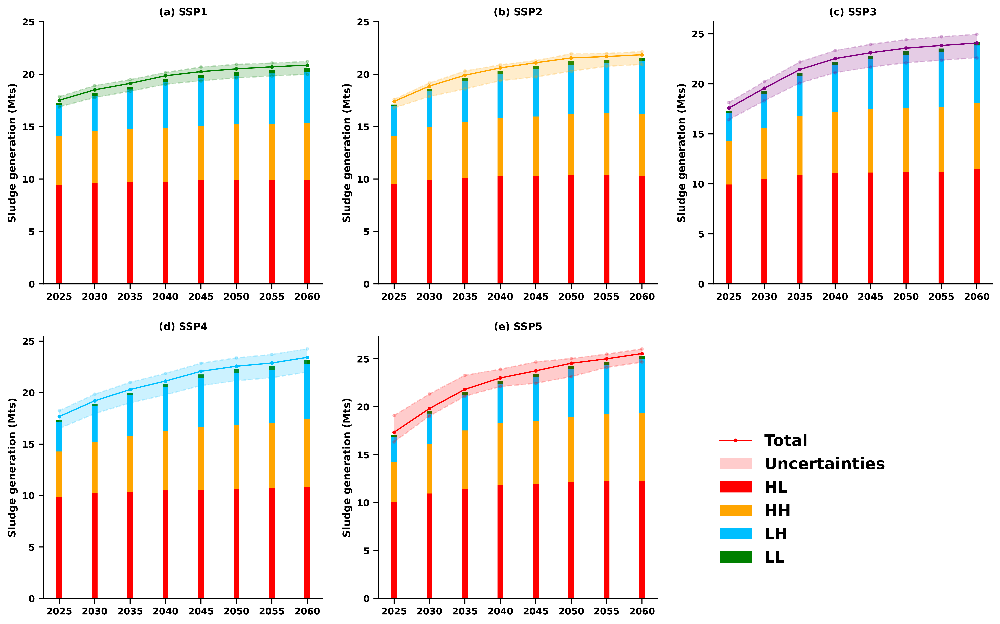

In [12]:
def draw_ssp_qg_result(df, SSP, number, color, result, width,label):
    sns.set_context("paper")
    
    #plt.rc('font',family='Times New Roman')
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==2)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000,
        label='HL', 
        color='red')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==1)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==1)][result]/1000,
        bottom=df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000,
        color='orange', 
        label='HH')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==3)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==3)][result]/1000,
        bottom=np.array(df[(df['SSP']==SSP) & (df['cator']==1)][result]/1000) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000),
        color='deepskyblue', 
        label='LH')
    
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==0)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==0)][result]/1000,
        bottom=np.array(df[(df['SSP']==SSP) & (df['cator']==1)][result]/1000) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==3)][result]/1000),
        color='g', 
        label='LL')
    
    #plt.plot(YEAR,
             #sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']+0.3,
             #linestyle='-', marker='.',
             #color=color)
                                                       
    plt.plot(YEAR[1:]+width,
             sens[SSP+'-'],
             linestyle='--', marker='.',
             color=color, alpha=0.2)
    
    plt.plot(YEAR[1:]+width,
             sens[SSP]+0.3,
             linestyle='-', marker='.',
             color=color,label=label)
    
    plt.plot(YEAR[1:]+width,
             sens[SSP+'+'],
             linestyle='--', marker='.',
             color=color, alpha=0.2)
    
    plt.fill_between(YEAR[1:]+width,sens[SSP+'-'], sens[SSP+'+'],
                 facecolor=color, alpha=0.2, label='Uncertainties')
    #for x,y in zip(YEAR, sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']):
    #    plt.text(x-1.6,y+1.4,'{:.2f}'.format(y), weight='bold',fontsize=8)
        
    #plt.ylabel('Sludge generation ($10^6$ tons)', weight='bold')
    #plt.ylim(0,26)
    #plt.xticks([2020,2025,2030,2035,2040,2045,2050,2055,2060], weight='bold')
    #plt.yticks([0,5,10,15,20,25], weight='bold')
    #plt.title(number+' '+SSP, weight='bold')
    plt.ylabel('Sludge generation (Mts)', weight='bold')
    plt.xticks([2025,2030,2035,2040,2045,2050,2055,2060], weight='bold')
    plt.yticks(np.arange(0,26,5), weight='bold')
    plt.title(number+' '+SSP, weight='bold')
    sns.despine()



plt.figure(figsize=(16, 10), dpi=600)

plt.subplot(2,3,1)
draw_ssp_qg_result(Sludge_predqg, 'SSP1', '(a)', 'green','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP1', '(a)', 'green','Sum_new_standard_future_GHG_After_AD',1, 'With AD')


plt.subplot(2,3,2)
draw_ssp_qg_result(Sludge_predqg, 'SSP2', '(b)', 'orange','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP2', '(b)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.subplot(2,3,3)
draw_ssp_qg_result(Sludge_predqg, 'SSP3', '(c)', 'purple','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP3', '(c)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.subplot(2,3,4)
draw_ssp_qg_result(Sludge_predqg, 'SSP4', '(d)', 'deepskyblue','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP4', '(d)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.subplot(2,3,5)
draw_ssp_qg_result(Sludge_predqg, 'SSP5', '(e)', 'red','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP5', '(e)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.legend(loc=(1.2,0.1), frameon=False, fontsize=15)
plt.rcParams.update({'font.weight':'bold'})
#plt.savefig('sludge_with_sens.jpg', dpi=600, bbox_inches='tight')

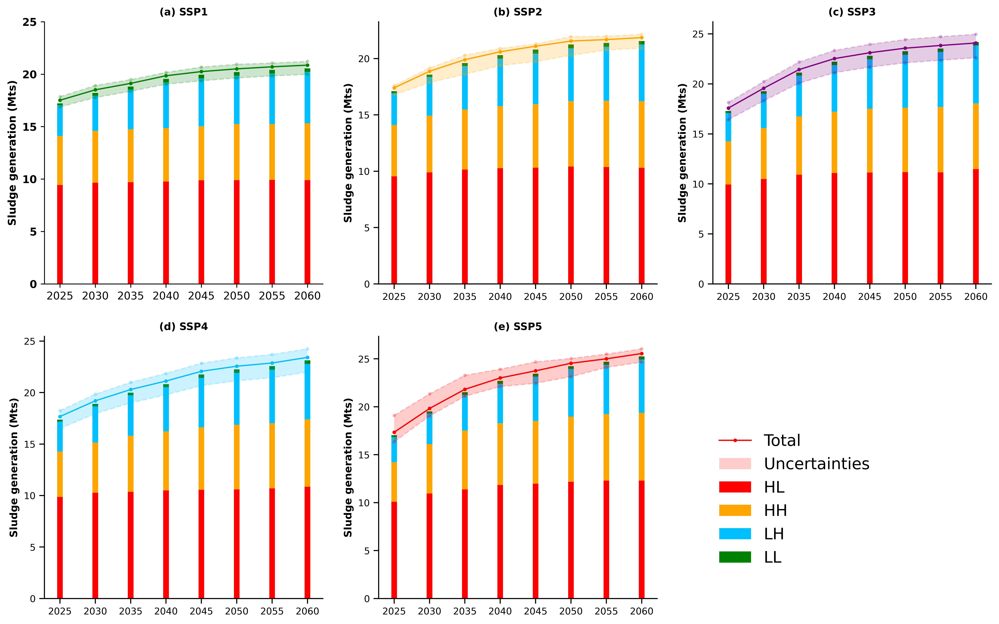

In [5]:
def draw_ssp_qg_result(df, SSP, number, color, result, width,label):
    sns.set_context("paper")
    
    #plt.rc('font',family='Times New Roman')
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==2)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000,
        label='HL', 
        color='red')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==1)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==1)][result]/1000,
        bottom=df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000,
        color='orange', 
        label='HH')
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==3)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==3)][result]/1000,
        bottom=np.array(df[(df['SSP']==SSP) & (df['cator']==1)][result]/1000) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000),
        color='deepskyblue', 
        label='LH')
    
    
    plt.bar(x=df[(df['SSP']==SSP) & (df['cator']==0)]['YEAR']+width, 
        height=df[(df['SSP']==SSP) & (df['cator']==0)][result]/1000,
        bottom=np.array(df[(df['SSP']==SSP) & (df['cator']==1)][result]/1000) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==2)][result]/1000) +
        np.array(df[(df['SSP']==SSP) & (df['cator']==3)][result]/1000),
        color='g', 
        label='LL')
    
    #plt.plot(YEAR,
             #sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']+0.3,
             #linestyle='-', marker='.',
             #color=color)
                                                       
    plt.plot(YEAR[1:]+width,
             sens[SSP+'-'],
             linestyle='--', marker='.',
             color=color, alpha=0.2)
    
    plt.plot(YEAR[1:]+width,
             sens[SSP]+0.3,
             linestyle='-', marker='.',
             color=color,label=label)
    
    plt.plot(YEAR[1:]+width,
             sens[SSP+'+'],
             linestyle='--', marker='.',
             color=color, alpha=0.2)
    
    plt.fill_between(YEAR[1:]+width,sens[SSP+'-'], sens[SSP+'+'],
                 facecolor=color, alpha=0.2, label='Uncertainties')
    #for x,y in zip(YEAR, sludge_pred_qg[(sludge_pred_qg['SSP']==SSP)]['SLUDGE_PRED']):
    #    plt.text(x-1.6,y+1.4,'{:.2f}'.format(y), weight='bold',fontsize=8)
        
    #plt.ylabel('Sludge generation ($10^6$ tons)', weight='bold')
    #plt.ylim(0,26)
    #plt.xticks([2020,2025,2030,2035,2040,2045,2050,2055,2060], weight='bold')
    #plt.yticks([0,5,10,15,20,25], weight='bold')
    #plt.title(number+' '+SSP, weight='bold')
    plt.ylabel('Sludge generation (Mts)', weight='bold')
    plt.xticks(None)
    plt.yticks(None)
    plt.title(number+' '+SSP, weight='bold')
    sns.despine()



plt.figure(figsize=(16, 10), dpi=600)

plt.subplot(2,3,1)

draw_ssp_qg_result(Sludge_predqg, 'SSP1', '(a)', 'green','SLUDGE_PRED',0, 'Total')
plt.yticks(np.arange(0,26,5), weight='bold')
#draw_ssp_qg_result(Sludge_predqg, 'SSP1', '(a)', 'green','Sum_new_standard_future_GHG_After_AD',1, 'With AD')


plt.subplot(2,3,2)
draw_ssp_qg_result(Sludge_predqg, 'SSP2', '(b)', 'orange','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP2', '(b)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.subplot(2,3,3)
draw_ssp_qg_result(Sludge_predqg, 'SSP3', '(c)', 'purple','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP3', '(c)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.subplot(2,3,4)
draw_ssp_qg_result(Sludge_predqg, 'SSP4', '(d)', 'deepskyblue','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP4', '(d)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.subplot(2,3,5)
draw_ssp_qg_result(Sludge_predqg, 'SSP5', '(e)', 'red','SLUDGE_PRED',0, 'Total')
#draw_ssp_qg_result(Sludge_predqg, 'SSP5', '(e)', 'green','Sum_2015_standard_future_GHG_After_AD',1, 'With AD')

plt.legend(loc=(1.2,0.1), frameon=False, fontsize=15)
plt.rcParams.update({'font.weight':'bold'})
#plt.savefig('sludge_with_sens.jpg', dpi=600, bbox_inches='tight')

In [9]:
pd.set_option('display.max_columns',None)
Sludge_predqg

,YEAR,SSP,cator,GDP,POP,CCF,人均CCF,BA,LDP,UR,FCE_P,FCE,SLUDGE_PRED,Landfill_2015,Incineration_2015,Land_application_2015,Building_material_2015,Landfill_percent_2015,Incineration_percent_2015,Land_application_percent_2015,Building_material_percent_2015,Landfill_percent_2030,Incineration_percent_2030,Land_application_percent_2030,Building_material_percent_2030,other,Landfill_percent_new,Incineration_percent_new,Land_application_percent_new,Building_material_percent_new,Landfill_2015_standard_future,Incineration_2015_standard_future,Land_application_2015_standard_future,Building_material_2015_standard_future,Landfill_2015_standard_future_GHG_Before_AD,Incineration_2015_standard_future_GHG_Before_AD,Land_application_2015_standard_future_GHG_Before_AD,Building_material_2015_standard_future_GHG_Before_AD,Landfill_2015_standard_future_GHG_After_AD,Incineration_2015_standard_future_GHG_After_AD,Land_application_2015_standard_future_GHG_After_AD,Building_material_2015_standard_future_GHG_After_AD,Sum_2015_standard_future_GHG_Before_AD,Sum_2015_standard_future_GHG_After_AD,PGER_2015_standard_future,Landfill_new_standard_future,Incineration_new_standard_future,Land_application_new_standard_future,Building_material_new_standard_future,Landfill_new_standard_future_GHG_Before_AD,Incineration_new_standard_future_GHG_Before_AD,Land_application_new_standard_future_GHG_Before_AD,Building_material_new_standard_future_GHG_Before_AD,Landfill_new_standard_future_GHG_After_AD,Incineration_new_standard_future_GHG_After_AD,Land_application_new_standard_future_GHG_After_AD,Building_material_new_standard_future_GHG_After_AD,Sum_new_standard_future_GHG_Before_AD,Sum_new_standard_future_GHG_After_AD,PGER_new_standard_future,Unnamed: 0,SSP1_2060,SSP2_2060,SSP3_2060,SSP4_2060,SSP5_2060,SLUDGE_2017,PSSP1_2060,PSSP2_2060,PSSP3_2060,PSSP4_2060,PSSP5_2060
0,2025,SSP1,0,1.131010e+04,20154458,4.413826e+08,180,1191.674487,9768.994771,160.955201,27662.579085,1021.513252,173.276983,17.6,3.3,24.6,0.0,1.375093,0.152432,1.472474,0.000000,0.3,0.6,1.65,0.45,0.15,0.15,0.15,2.1,0.6,49.579460,12.826378,110.871144,0.000000,0.098762,0.075034,0.056433,0.000000,0.028161,0.051306,0.038916,0.000000,0.230230,0.118382,-0.111848,8.663849,8.663849,121.293888,34.655397,0.017258,0.050684,0.061739,0.202388,0.004921,0.034655,0.042574,0.029180,0.332068,0.111330,-0.220738,49,3.391195e+05,3.092205e+05,3.488238e+05,3.431904e+05,3.178134e+05,164858,6.904247,6.732221,8.818889,7.590295,7.989407
1,2025,SSP1,1,1.755875e+05,262175700,5.741648e+09,420,12919.480954,182329.959380,466.692765,62999.425414,14744.840921,4677.708498,349.4,113.3,126.9,147.8,3.519373,0.856171,1.251868,1.372588,0.7,1.4,3.85,1.05,0.35,0.35,0.35,4.9,1.4,2320.753857,570.731373,790.119212,996.104057,4.622942,3.338779,0.402171,5.817248,1.318188,2.282925,0.277332,0.838720,14.181139,4.717165,-9.463973,233.885425,233.885425,3274.395949,935.541700,0.465900,1.368230,1.666668,5.463564,0.132847,0.935542,1.149313,0.787726,8.964361,3.005428,-5.958933,86,5.417739e+06,5.921435e+06,6.574646e+06,6.551761e+06,7.087462e+06,928712,42.974703,47.165033,52.338073,52.560925,56.017264
2,2025,SSP1,2,8.011957e+05,760615816,1.665749e+10,660,39444.007393,550687.701150,782.177183,104490.944535,49314.664329,9427.093860,1643.4,1198.2,826.8,612.7,4.830048,2.247833,2.439726,1.482393,1.1,2.2,6.05,1.65,0.55,0.55,0.55,7.7,2.2,3835.335219,2116.228361,2066.480421,1409.049859,7.639988,12.379936,1.051839,8.228851,2.178470,8.464913,0.725335,1.186420,29.300613,12.555138,-16.745475,471.354693,471.354693,6598.965702,1885.418772,0.938939,2.757425,3.358874,11.010846,0.267729,1.885419,2.316237,1.587523,18.066083,6.056908,-12.009175,153,9.900021e+06,1.030483e+07,1.147572e+07,1.085749e+07,1.228925e+07,7893780,17.356845,18.251325,21.273583,19.308715,23.273099
3,2025,SSP1,3,1.451661e+05,280100221,6.134195e+09,540,11657.256605,117066.051149,532.231782,65136.960998,11701.857089,2936.061176,574.7,26.2,146.1,69.2,6.914745,0.265583,1.386952,0.432721,0.9,1.8,4.95,1.35,0.45,0.45,0.45

In [10]:
Sludge_predqg2[(Sludge_predqg2['SSP']=='SSP5')]['SLUDGE_PRED']/1000

4     17.040265
9     19.521532
14    21.520075
19    22.707695
24    23.450522
29    24.239964
34    24.701694
Name: SLUDGE_PRED, dtype: float64

In [14]:
pd.set_option('display.max_columns', None)
Sludge_predqg.toExcel

AttributeError: 'DataFrame' object has no attribute 'toExcel'

In [11]:
Sludge_predqg.groupby(['YEAR', 'SSP']).sum().reset_index().to_csv('calc_uncern.csv')

In [12]:
show = pd.DataFrame()
for ssp in ['SSP1','SSP2','SSP3','SSP4','SSP5']:
    for cat in range(4):
        for way in ['Before','After']:
            show[ssp+'_'+'{}_'.format(cat)+way] = list(Sludge_predqg[(Sludge_predqg['SSP']==ssp) & (Sludge_predqg['cator']==cat)]['Sum_2015_standard_future_GHG_'+way+'_AD'])
            #print(Sludge_predqg[(Sludge_predqg['SSP']==ssp) & (Sludge_predqg['cator']==cat)]['Sum_2015_standard_future_GHG_'+way+'_AD'])
#show.to_csv('jxgo.csv')


<ipython-input-13-7e75dbb042b5>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  values_beforeAD_2015 = CO2_2030[CO2_2030['Process'] == 'Before_AD'][CO2_2030['percent'] == 2015].CO2_EQ
<ipython-input-13-7e75dbb042b5>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  values_afterAD_2015 = CO2_2030[CO2_2030['Process'] == 'After_AD'][CO2_2030['percent'] == 2015].CO2_EQ
<ipython-input-13-7e75dbb042b5>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  values_beforeAD_2030 = CO2_2030[CO2_2030['Process'] == 'Before_AD'][CO2_2030['percent'] == 2030].CO2_EQ
<ipython-input-13-7e75dbb042b5>:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  values_afterAD_2030  = CO2_2030[CO2_2030['Process'] == 'After_AD'][CO2_2030['percent'] == 2030 ].CO2_EQ


ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (5).

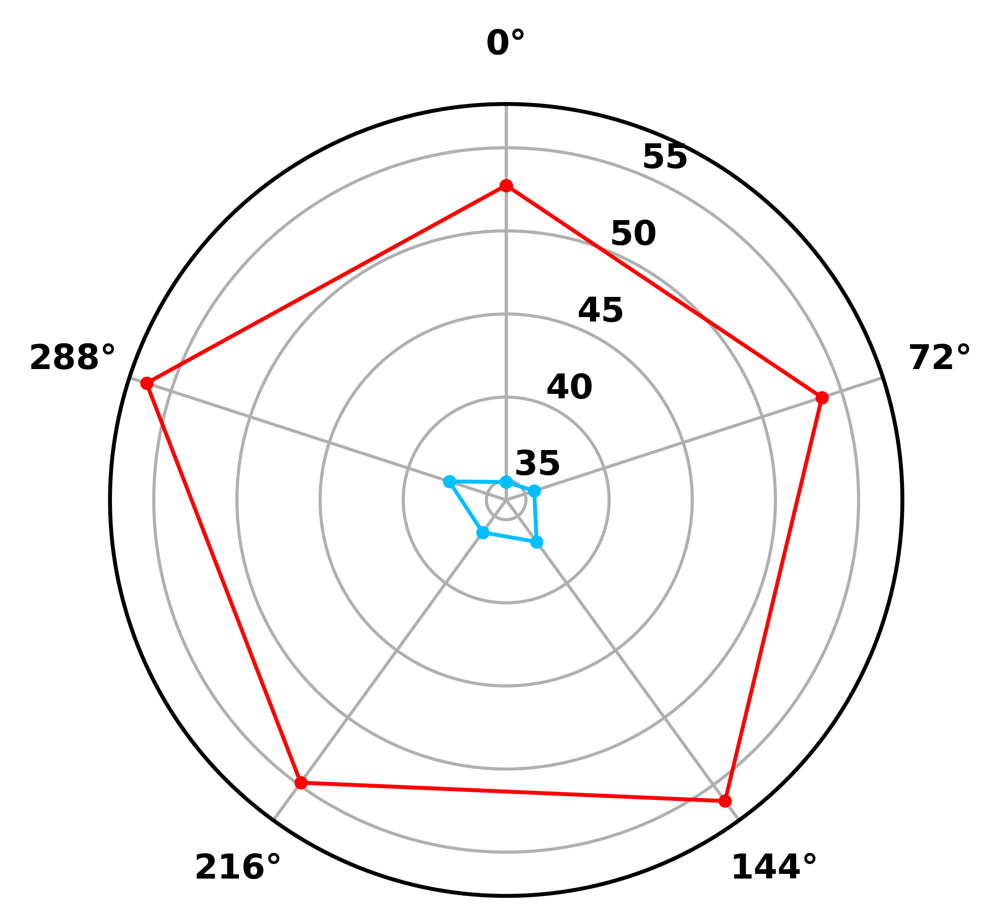

In [13]:
#雷达图绘制
CO2_2030 = data.parse('CO2_2030')
#plt.style.use('default')
fig=plt.figure(figsize=(8,6), dpi=600)
ax = fig.add_subplot(121, polar=True)

values_beforeAD_2015 = CO2_2030[CO2_2030['Process'] == 'Before_AD'][CO2_2030['percent'] == 2015].CO2_EQ
values_afterAD_2015 = CO2_2030[CO2_2030['Process'] == 'After_AD'][CO2_2030['percent'] == 2015].CO2_EQ

ticks = ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']
values_beforeAD_2030 = CO2_2030[CO2_2030['Process'] == 'Before_AD'][CO2_2030['percent'] == 2030].CO2_EQ
values_afterAD_2030  = CO2_2030[CO2_2030['Process'] == 'After_AD'][CO2_2030['percent'] == 2030 ].CO2_EQ
values_beforeAD_2030 = np.concatenate((values_beforeAD_2030, [values_beforeAD_2030[10]]))
values_afterAD_2030 = np.concatenate((values_afterAD_2030, [values_afterAD_2030[15]]))

angles = np.linspace(0, 2*np.pi, len(values_beforeAD_2015), endpoint=False)

values_beforeAD_2015 = np.concatenate((values_beforeAD_2015, [values_beforeAD_2015[0]]))
values_afterAD_2015 = np.concatenate((values_afterAD_2015, [values_afterAD_2015[5]]))
ticks = np.concatenate((ticks, [ticks[0]]))
angles = np.concatenate((angles,[angles[0]]))

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rticks(np.arange(30, 60, 5))

ax.plot(angles, values_beforeAD_2015, '.-', linewidth=1, color='red', label='Sludge management in 2015')
ax.plot(angles, values_beforeAD_2030, '.-', linewidth=1, color='deepskyblue', label='Sludge management in 2030')

ax.set_thetagrids(angles * 180/np.pi, ticks[0:-1], fontsize=6)
#ax.set_rscale('symlog')

#ax.legend(loc=(1,1))
#ax.text(0.85,17,'Unit: Mt ${CO_2-eq}$')
ax.text(-np.pi/4,74,'(a) Without AD')
#ax.set_rlabel_position(-40)

#雷达图绘制

#plt.style.use('default')
#fig=plt.figure(figsize=(6,6), dpi=300)
ax = fig.add_subplot(122, polar=True)

values_beforeAD_2030 = CO2_2030[CO2_2030['Process'] == 'Before_AD'][CO2_2030['percent'] == 2030].CO2_EQ
values_afterAD_2030  = CO2_2030[CO2_2030['Process'] == 'After_AD'][CO2_2030['percent'] == 2030 ].CO2_EQ

ticks = ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']


angles = np.linspace(0, 2*np.pi, len(values_beforeAD_2030), endpoint=False)

values_beforeAD_2030 = np.concatenate((values_beforeAD_2030, [values_beforeAD_2030[10]]))
values_afterAD_2030 = np.concatenate((values_afterAD_2030, [values_afterAD_2030[15]]))
ticks = np.concatenate((ticks, [ticks[0]]))
angles = np.concatenate((angles,[angles[0]]))

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rticks(np.arange(10, 30, 2))

ax.plot(angles, values_afterAD_2015, '.-', linewidth=1, color='red', label='Present sludge disposal methods')
ax.plot(angles, values_afterAD_2030, '.-', linewidth=1, color='deepskyblue', label='Improved sludge disposal methods')

ax.set_thetagrids(angles * 180/np.pi, ticks[0:-1], fontsize=6)
#ax.set_rscale('symlog')

ax.legend(loc=(0.8,1.05),frameon=False)
ax.text(6.83,24.3,'Unit: Mt ${CO_2}$')
ax.text(-np.pi/4,30.5,'(b) With AD')
#ax.set_rlabel_position(-40)

#plt.savefig('2020_cc.jpg',dpi=600, bbox_inches='tight')

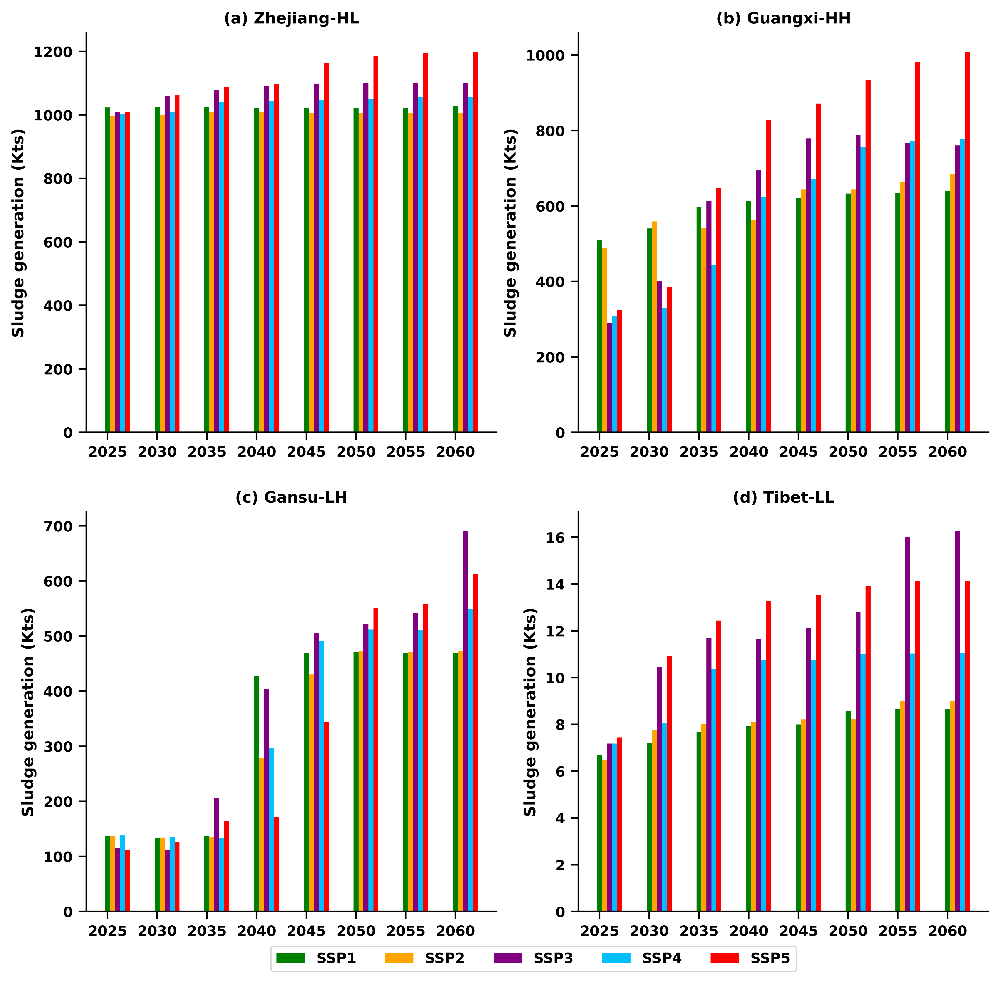

In [41]:
def draw_ssp_PRO2(df, pro, year, al, name,cat):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    
    
   
    
    
    
    
    
    
    
    
    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1']['SLUDGE_PRED'],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2']['SLUDGE_PRED'],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3']['SLUDGE_PRED'],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4']['SLUDGE_PRED'],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5']['SLUDGE_PRED'],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel('Sludge generation (Kts)', weight='bold')
    plt.xticks(year, weight='bold')
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat, weight='bold')
    
    sns.despine()
    

plt.figure(figsize=(10,10),dpi=600)

plt.subplot(2,2,1)
draw_ssp_PRO2(sludge_pred ,'Zhejiang',year, 1,'(a)','-HL')

plt.subplot(2,2,2)
draw_ssp_PRO2(sludge_pred ,'Guangxi',year, 1,'(b)','-HH')


plt.subplot(2,2,3)
draw_ssp_PRO2(sludge_pred ,'Gansu',year, 1, '(c)','-LH')

plt.subplot(2,2,4)
draw_ssp_PRO2(sludge_pred ,'Tibet',year, 1, '(d)','-LL')

plt.legend(ncol=5, loc=(-0.75,-0.15))
plt.rcParams.update({'font.weight':'bold'})
plt.savefig('show_pro.jpg', dpi=600, bbox_inches='tight')

In [ ]:
def draw_ssp_PRO2(df, pro, year, al, name,cat):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1']['SLUDGE_PRED'],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2']['SLUDGE_PRED'],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3']['SLUDGE_PRED'],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4']['SLUDGE_PRED'],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5']['SLUDGE_PRED'],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel('Sludge generation ($10^3$ tons)')
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()
plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO2(sludge_pred, EPROVINCE[num] ,year, 1,'','')
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('all_pro.jpg', bbox_inches='tight', dpi=600)
#plt.rcParams.update({'font.weight':'bold'})

In [14]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel)
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','GDP','A hundred millions Yuan')
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('GDP_all.jpg' ,bbox_inches='tight', dpi=600)

<Figure size 432x288 with 0 Axes>

In [15]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel, ADJUST):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    df[var] = df[var]/ADJUST
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel)
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','POP','Ten thousands People',10000)
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('POP_all.jpg' ,bbox_inches='tight', dpi=600)

<Figure size 432x288 with 0 Axes>

In [16]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel, ADJUST):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    df[var] = df[var]/ADJUST
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel)
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','CCF','Million tons',1000000000)
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('CCF_all.jpg' ,bbox_inches='tight', dpi=600)

<Figure size 432x288 with 0 Axes>

In [17]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel, ADJUST):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    df[var] = df[var]/ADJUST
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel)
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','BA','Square kilometers',1)
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('BA_all.jpg' ,bbox_inches='tight', dpi=600)

<Figure size 432x288 with 0 Axes>

In [18]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel, ADJUST):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    df[var] = df[var]/ADJUST
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel)
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','LDP','kilometers',1)
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('LDP_all.jpg' ,bbox_inches='tight', dpi=600)

<Figure size 432x288 with 0 Axes>

In [ ]:
year = year[1:]

In [ ]:
year

In [ ]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel, ADJUST):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    df[var] = df[var]/ADJUST
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel,weight='bold')
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','UR','Percent',1)
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
#plt.savefig('UR_all.jpg' ,bbox_inches='tight', dpi=600)
plt.show()

In [ ]:
draw_ssp_PRO3(sludge_pred, EPROVINCE[22] ,year, 1,'','','SLUDGE_PRED','Sludge generation ($10^3$ tons)',1)
plt.legend(ncol=5, loc=(-0.13,-0.20), fontsize=10)
plt.rcParams.update({'font.weight':'bold'})
plt.savefig('shanghai.jpg',dpi=400, bbox_inches='tight')

In [ ]:
def draw_ssp_PRO3(df, pro, year, al, name, cat, var, ylabel, ADJUST):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    df[var] = df[var]/ADJUST
    

    
    
    plt.bar(df[df['SSP']=='SSP1']['YEAR'], 
        df[df['SSP']=='SSP1'][var],
        label='SSP1',width=0.5,
        color='green',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP2']['YEAR']+0.5, 
        df[df['SSP']=='SSP2'][var],
        label='SSP2',width=0.5,
        color='orange',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP3']['YEAR']+1, 
        df[df['SSP']=='SSP3'][var],
        label='SSP3',width=0.5,
        color='purple',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP4']['YEAR']+1.5, 
        df[df['SSP']=='SSP4'][var],
        label='SSP4',width=0.5,
        color='deepskyblue',alpha=al)
    
    plt.bar(df[df['SSP']=='SSP5']['YEAR']+2, 
        df[df['SSP']=='SSP5'][var],
        label='SSP5', width=0.5,
        color='red',alpha=al)

        
    plt.ylabel(ylabel)
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(name+' '+pro+cat)
    
    sns.despine()

plt.subplots_adjust(hspace=0.8)
EPROVINCE = sorted(list(set(sludge_pred['EPROVINCE'])))
plt.figure(figsize=(30,25),dpi=600)

for num in range(30):
    plt.subplot(6,5,num+1)
    draw_ssp_PRO3(sludge_pred, EPROVINCE[num] ,year, 1,'','','FCE','A Hundred Million Yuans',1)
    
plt.legend(ncol=5, loc=(-3.0,-0.30), fontsize=18)
plt.savefig('FCE_all.jpg' ,bbox_inches='tight', dpi=600)

In [ ]:
sludge_pred

In [ ]:
'''plt.figure(figsize=(6, 6), dpi=400)

plt.rc('font',family='Times New Roman')


num = np.arange(0,len(q_values['VAR']), 1)
plt.barh(num, q_values['Q'])
plt.yticks(num, q_values['VAR'])


sns.despine()

for a, b in zip(q_values['Q'], num):
    plt.text(a, b, '%.2f' % a,fontsize=11)
    
    
    
Interaction = geodetector_data.parse('Interaction')

Interaction['VAR'] = Interaction.var1 + ' ∩ ' + Interaction.var2
Interaction = Interaction.sort_values(by='qv12', ascending=False)
Interaction 

plt.figure(figsize=(12, 3), dpi=400)

plt.rc('font',family='Times New Roman')


num = np.arange(0,len(Interaction['VAR']), 1)

#sns.barplot(x='VAR', y=('qv1','qv2'), data=Interaction)
bar_width = 0.2
plt.bar(num, Interaction['qv1'], bar_width, align="center", color="orange", label="X1", alpha=0.5)
plt.bar(num + bar_width, Interaction['qv2'], bar_width, align="center", color="c", label="X2", alpha=0.5)
plt.bar(num + 2*bar_width, Interaction['qv12'], bar_width, align="center", color="red", label="X1∩X2", alpha=0.5)

plt.xticks(num, Interaction['VAR'], rotation=90)
plt.ylabel('Q value')
plt.legend()
sns.despine()

#plt.savefig('4.png', dpi=400, bbox_inches = 'tight')
'''

In [ ]:
train_city = train_data.parse('地级市')

city_2017 =  train_city[train_city['YEAR']==2017]

city_2017 = city_2017[city_2017['PROVINCE']!='全国']

city_2017['SLUDGE'] = city_2017['SLUDGE']/1000
city_2017 = city_2017.sort_values(by='SLUDGE', ascending=False)
city_2017['slu_per'] = city_2017['SLUDGE'] / np.sum(city_2017['SLUDGE'])

city_2017['slu_pc'] = city_2017['SLUDGE']*1000000 / city_2017['POP']
city_2017_pc = city_2017.sort_values(by='slu_pc', ascending=False)

city_2017_pc.head(10)

np.sum(city_2017['SLUDGE'])*1000000 / np.sum(city_2017['POP'])



In [ ]:
sludge_pred = pd.read_csv('final_result.csv', encoding='utf-8')

sludge_pred['SLUDGE_PRED'] = sludge_pred['SLUDGE_PRED']/1000

def draw_ssp_PRO(df, pro, year):
    df = df[df['EPROVINCE']==pro]
    df = df.set_index('YEAR')
    df = df.loc[year]
    df = df.reset_index()
    
    plt.rc('font',family='Times New Roman')
   
    
    
    plt.bar(x=df[df['SSP']=='SSP5']['YEAR'], 
        height=df[df['SSP']=='SSP5']['SLUDGE_PRED'],
        label='SSP5',
        color='red')
    
    plt.bar(x=df[df['SSP']=='SSP3']['YEAR'], 
        height=df[df['SSP']=='SSP3']['SLUDGE_PRED'],
        label='SSP3',
        color='purple')
    
    plt.bar(x=df[df['SSP']=='SSP4']['YEAR'], 
        height=df[df['SSP']=='SSP4']['SLUDGE_PRED'],
        label='SSP4',
        color='deepskyblue')
    
    plt.bar(x=df[df['SSP']=='SSP2']['YEAR'], 
        height=df[df['SSP']=='SSP2']['SLUDGE_PRED'],
        label='SSP2',
        color='orange')
    
    plt.bar(x=df[df['SSP']=='SSP1']['YEAR'], 
        height=df[df['SSP']=='SSP1']['SLUDGE_PRED'],
        label='SSP1',
        color='green')

        
    plt.ylabel('Sludge generation ($10^6$ tons)')
    plt.xticks(year)
    #plt.yticks([0,5,10,15,20,25])
    plt.title(pro)
    
    sns.despine()
    


draw_ssp_PRO(sludge_pred ,'Shanghai',year)

for name in set(sludge_pred[sludge_pred['Region']=='Eastern coastal region']['EPROVINCE']):
    plt.figure()
    draw_ssp_PRO(sludge_pred ,name,year)

In [ ]:
def precent_pro(pro, ssp, a):

    pro = sludge_pred[(sludge_pred['EPROVINCE']==pro)]
    pro = pro[pro['SSP']==ssp]
    pro = pro[pro['YEAR']==2060]
    return (pro['SLUDGE_PRED'] - a)/ pro['SLUDGE_PRED']

sludge_pred_2060 = sludge_pred[sludge_pred['YEAR']==2060]
sludge_pred_2060['SLUDGE_PRED'] = sludge_pred_2060['SLUDGE_PRED']/1000
sludge_pred_2060.loc[sludge_pred_2060[sludge_pred_2060['Region']=='Eastern coastal region'].index,'Region'] = 'Eastern region'

def draw_ssp_PRO_2060(df, SSP):
    
    
    #plt.rc('font',family='Times New Roman')
    #plt.figure(figsize=(8, 5), dpi=300)
    sns.set_context("paper")
    colors = [(190/255,233/255,1),(255/255,251/255,201/255), (208/255,245/255,185/255)]
    #sns.set(style="white")
    df = df[df['SSP']==SSP]
    df = df.sort_values(by='SLUDGE_PRED', ascending=False)
    
    sns.barplot(x='EPROVINCE', y='SLUDGE_PRED',hue='Region',dodge=False, data=df,palette=colors)
    
    plt.xticks(rotation=90)
    plt.xlabel(None)
    #plt.gca().legend().set_title('') 
    plt.legend().remove()
    plt.ylabel('Sludge generation ($10^3$ tons)', weight='bold')
    
    plt.xticks(fontsize=10,weight='bold')
    plt.yticks(fontsize=10,weight='bold')
    plt.title(SSP,weight='bold')
    sns.despine()
    #plt.title(SSP)
    

#plt.rc('font',family='Times New Roman')
plt.figure(figsize=(20, 12), dpi=600)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.2, hspace=0.45)


plt.subplot(2,3,1)
draw_ssp_PRO_2060(sludge_pred_2060, 'SSP1')

plt.subplot(2,3,2)
draw_ssp_PRO_2060(sludge_pred_2060, 'SSP2')

plt.subplot(2,3,3)
draw_ssp_PRO_2060(sludge_pred_2060, 'SSP3')

plt.subplot(2,3,4)
draw_ssp_PRO_2060(sludge_pred_2060, 'SSP4')

plt.subplot(2,3,5)
draw_ssp_PRO_2060(sludge_pred_2060, 'SSP5')

plt.legend(loc=(1.3,0.4),frameon=False, fontsize=22)
plt.rcParams.update({'font.weight':'bold'})
#plt.subplot(2,3,6)

#plt.savefig('2060sludge_pro.jpg',dpi=600, bbox_inches = 'tight')

In [ ]:
Sludge_predqg2[Sludge_predqg2['YEAR']==2030][['Sum_new_standard_future_GHG_Before_AD','Sum_new_standard_future_GHG_After_AD','Sum_2015_standard_future_GHG_Before_AD','Sum_2015_standard_future_GHG_After_AD']]

In [ ]:
#展示上海的污泥预测数据

In [3]:
Sludeg_Shanghai = Sludge_pred[Sludge_pred['PROVINCE'] == '上海市']

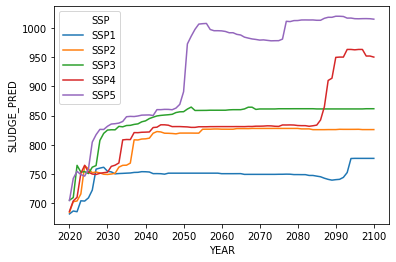

In [7]:
sns.lineplot(x='YEAR', y='SLUDGE_PRED',hue='SSP', data=Sludeg_Shanghai)